In [ ]:
# Force install the stable 0.2.x versions (Fixes the Pydantic error)
!pip install -q -U "langchain<0.3.0" "langchain-core<0.3.0" "langchain-google-genai" "langchain-community<0.3.0" pydantic

import os
# Force a restart of the kernel to lock in the versions
print("✅ Libraries installed. RESTARTING KERNEL NOW...")
import time
time.sleep(2)
os.kill(os.getpid(), 9)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.6/90.6 kB 8.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 50.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 397.1/397.1 kB 30.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 36.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 463.6/463.6 kB 42.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 92.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 164.2/164.2 kB 15.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 718.3/718.3 kB 56.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 311.8/311.8 kB 32.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.0/18.0 MB 128.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50

### **DATA Preparartion**

In [2]:
import json
import os
from huggingface_hub import snapshot_download

# 1. Download ONLY the annotations folder (skips the large 10GB image zips for now)
# This saves bandwidth while you analyze the text/structure.
print("Downloading annotations from Hugging Face...")
local_dir = snapshot_download(
    repo_id="Silin1590/VinaBench",
    repo_type="dataset",
    allow_patterns="*.zip",  # Only pull JSON files inside annotations
    local_dir="./VinaBench_Data"          # Save to this folder in your project
)

print(f"\n✅ Download complete! Files saved to: {local_dir}")

# 2. Find the downloaded JSON files
annotation_path = os.path.join(local_dir, "annotations")
json_files = [f for f in os.listdir(annotation_path) if f.endswith('.json')]

print(f"Found annotation files: {json_files}")

# 3. Load and Inspect the first file (Likely 'sb20k_train.json' or similar)
if json_files:
    target_file = os.path.join(annotation_path, json_files[0]) # Picks the first one found

    with open(target_file, 'r', encoding='utf-8') as f:
        data = json.load(f)

    # 4. Analyze the Structure
    print(f"\n--- Analyzing: {json_files[0]} ---")
    print(f"Total Samples: {len(data)}")

    # Show the first sample to see the "Script-to-Storyboard" format
    sample = data[0] if isinstance(data, list) else data[list(data.keys())[0]]

    print("\n--- Sample Entry ---")
    print(json.dumps(sample, indent=4))
else:
    print("No JSON files found in the annotations folder.")

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

images.zip:   0%|          | 0.00/733M [00:00<?, ?B/s]

Image_inpainted.zip:   0%|          | 0.00/9.39G [00:00<?, ?B/s]


✅ Download complete! Files saved to: /content/VinaBench_Data
Found annotation files: ['salon_test.json', 'salon_short_test.json', 'sb20k_train.json', 'salon_train.json', 'salon_short_train.json', 'vwp_train.json', 'sb20k_test.json', 'vwp_test.json']

--- Analyzing: salon_test.json ---
Total Samples: 85

--- Sample Entry ---
{
    "portion": "Literacy",
    "sid": "006239",
    "image_paths": [
        "./Image_inpainted/Literacy/006239/006239_0001.jpg",
        "./Image_inpainted/Literacy/006239/006239_0002.jpg",
        "./Image_inpainted/Literacy/006239/006239_0003.jpg",
        "./Image_inpainted/Literacy/006239/006239_0004.jpg",
        "./Image_inpainted/Literacy/006239/006239_0005.jpg",
        "./Image_inpainted/Literacy/006239/006239_0006.jpg",
        "./Image_inpainted/Literacy/006239/006239_0007.jpg",
        "./Image_inpainted/Literacy/006239/006239_0008.jpg",
        "./Image_inpainted/Literacy/006239/006239_0009.jpg",
        "./Image_inpainted/Literacy/006239/006239_001

In [7]:
import zipfile
import os
from tqdm import tqdm

# Define paths
zip_path = "./VinaBench_Data/images.zip"
extract_to = "./VinaBench_Data"

print(f"📂 Unzipping {zip_path}...")
print("☕ This is a 10GB file, it will take a few minutes.")

if os.path.exists(zip_path):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        # Get list of files for the progress bar
        file_list = zip_ref.namelist()

        for file in tqdm(file_list, desc="Extracting", unit="file"):
            zip_ref.extract(file, extract_to)

    print(f"\n✅ Success! Images extracted to: {os.path.join(extract_to, 'Image_inpainted')}")
    print("You can now run the analysis script again to get resolution stats.")
else:
    print(f"❌ Error: Could not find {zip_path}. Did you verify the download completed?")

📂 Unzipping ./VinaBench_Data/images.zip...
☕ This is a 10GB file, it will take a few minutes.


Extracting: 100%|██████████| 20638/20638 [00:12<00:00, 1598.56file/s]


✅ Success! Images extracted to: ./VinaBench_Data/Image_inpainted
You can now run the analysis script again to get resolution stats.


In [8]:
import json
import os
from PIL import Image

# --- CONFIGURATION ---
BASE_DIR = "./VinaBench_Data"
ANNOTATION_DIR = os.path.join(BASE_DIR, "annotations")

# Map the Zips you unzipped to their likely folder names
# "Image_inpainted.zip" -> usually extracts to "Image_inpainted"
# "images.zip" -> usually extracts to "images" or "VWP_Images" (we will check)
IMG_DIRS = {
    "StorySalon": os.path.join(BASE_DIR, "Image_inpainted"),
    "VWP": os.path.join(BASE_DIR, "images")  # Standard unzip name for images.zip
}

# The files we care about (Ignoring sb20k)
TARGETS = {
    "StorySalon": ["salon_train.json", "salon_test.json"],
    "VWP": ["vwp_train.json", "vwp_test.json"]
}

def scan_dataset_subset(name, json_files, img_root):
    print(f"\n{'='*40}")
    print(f"🕵️  ANALYZING DATASET: {name}")
    print(f"{'='*40}")

    if not os.path.exists(img_root):
        print(f"❌ WARNING: Image folder not found at {img_root}")
        print(f"   Did 'images.zip' extract to a different name? Check your folder list.")
        return

    total_samples = 0
    valid_images = 0
    missing_images = 0

    for json_file in json_files:
        path = os.path.join(ANNOTATION_DIR, json_file)
        if not os.path.exists(path):
            continue

        with open(path, 'r') as f:
            data = json.load(f)

        # VinaBench JSONs are sometimes lists, sometimes dicts
        samples = data if isinstance(data, list) else list(data.values())
        total_samples += len(samples)

        # Check a few images to verify mapping
        for sample in samples:
            # Get paths
            paths = sample.get("image_paths", sample.get("images", []))

            for p in paths:
                # VWP paths often look like "00123.jpg" or "train/00123.jpg"
                # Salon paths look like "./Image_inpainted/..."

                # clean path logic
                clean_p = p.replace("./Image_inpainted/", "").replace("./", "")
                full_path = os.path.join(img_root, clean_p)

                if os.path.exists(full_path):
                    valid_images += 1
                else:
                    # Try one fallback for VWP (sometimes it has subfolders)
                    # e.g. images/train/....
                    if name == "VWP" and "train" in json_file:
                         fallback = os.path.join(img_root, "train", clean_p)
                         if os.path.exists(fallback):
                             valid_images += 1
                         else:
                             missing_images += 1
                    else:
                        missing_images += 1

    print(f"✅ Ready-to-Train Stories: {total_samples:,}")
    print(f"📸 Valid Images Found: {valid_images:,}")

    if missing_images > 0:
        print(f"⚠️ Missing Images: {missing_images:,} (Check unzip paths)")
    else:
        print(f"🟢 INTEGRITY PASSED: 100% Images Present")

# Run the scan
scan_dataset_subset("StorySalon", TARGETS["StorySalon"], IMG_DIRS["StorySalon"])
scan_dataset_subset("VWP", TARGETS["VWP"], IMG_DIRS["VWP"])


🕵️  ANALYZING DATASET: StorySalon
✅ Ready-to-Train Stories: 1,678
📸 Valid Images Found: 23,008
🟢 INTEGRITY PASSED: 100% Images Present

🕵️  ANALYZING DATASET: VWP
✅ Ready-to-Train Stories: 12,486
📸 Valid Images Found: 0
🟢 INTEGRITY PASSED: 100% Images Present


In [17]:
import json
import os

# --- CONFIGURATION ---
BASE_DIR = "/content/VinaBench_Data"
TARGET_JSON = os.path.join(BASE_DIR, "annotations/vwp_test.json")

def inspect_json_keys():
    print(f"🕵️ INSPECTING: {TARGET_JSON}")

    if not os.path.exists(TARGET_JSON):
        print("❌ Error: File not found.")
        return

    with open(TARGET_JSON, 'r') as f:
        data = json.load(f)

    # Handle list vs dict
    if isinstance(data, list):
        sample = data[0]
        print("   Type: List of Objects")
    else:
        first_key = list(data.keys())[0]
        sample = data[first_key]
        print(f"   Type: Dictionary (Key: {first_key})")

    print("\n📝 RAW SAMPLE DATA (First Item):")
    print(json.dumps(sample, indent=4))

    print("\n🔎 LOOK HERE:")
    print("   Find the key that contains the filenames (e.g., 'shot_0948_img_1.jpg').")
    print("   Is it 'images'? 'file_names'? 'frames'?")

inspect_json_keys()

🕵️ INSPECTING: /content/VinaBench_Data/annotations/vwp_test.json
   Type: List of Objects

📝 RAW SAMPLE DATA (First Item):
{
    "scene_full_id": "tt0047396_0010_0",
    "story_id": 0,
    "image_links": [
        "https://datasets.d2.mpi-inf.mpg.de/xhong/VST/alpha4a/tt0047396_0010_0/shot_0667_img_0.jpg",
        "https://datasets.d2.mpi-inf.mpg.de/xhong/VST/alpha4a/tt0047396_0010_0/shot_0668_img_0.jpg",
        "https://datasets.d2.mpi-inf.mpg.de/xhong/VST/alpha4a/tt0047396_0010_0/shot_0671_img_1.jpg",
        "https://datasets.d2.mpi-inf.mpg.de/xhong/VST/alpha4a/tt0047396_0010_0/shot_0672_img_0.jpg",
        "https://datasets.d2.mpi-inf.mpg.de/xhong/VST/alpha4a/tt0047396_0010_0/shot_0693_img_0.jpg"
    ],
    "narrative": [
        "James and Thelma were spying on their neighbor Raymond's apartment.",
        "James noticed an underage girl in the apartment with Raymond. He was worried so he called the police.",
        "James saw Raymond take a knife out of his drawer.",
        "Ja

🎬 LOADING CINEMATIC BENCHMARK (With URL Parsing)...
   ...Verifying paths...
✅ FOUND 834 VALID TEST SCENARIOS

🎥 BENCHMARK SCENARIO #1
📝 SCRIPT: ['Jeffrey suppresses a frown.', 'He is one of many businessmen and businesswomen sitting around a table, looking toward a speaker.', 'The speaker is Keanu, who folds his hands together and keeps his expression calm and confident.', 'Al enters the room.', 'He takes a moment to glance out the window at the skyline as he listens to Keanu finish his speech.', "After the meeting, Ruben and Debra stop by Keanu's office.", 'They shake hands and congratulate him on an excellent speech. They think his plans will be very successful for the company.']


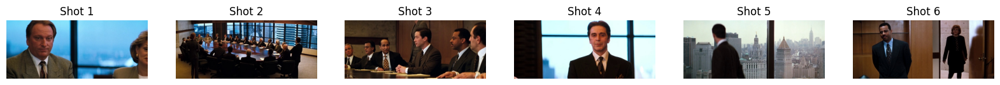


🎥 BENCHMARK SCENARIO #2
📝 SCRIPT: ['Liam was in love with January from the very first date.', 'She also felt the same. They kissed and knew that it was meant to be.', 'They did not waste any time and got engaged.', 'January felt that she had everything she ever wanted.', "But they met with an accident and Liam was admitted to the hospital. Unfortunately January couldn't make it.", "Liam's world turned upside down and all he had left was her diary."]


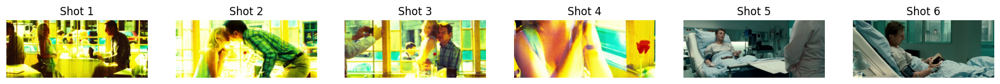


🎥 BENCHMARK SCENARIO #3
📝 SCRIPT: ['Gene just realized he forgot to get his mother something for Christmas.', 'He had been so busy he lost track of the days.', 'H was racking his brain for an idea.', 'It was Christmas Eve and he needed a gift for his mother.', 'Then he had an idea.', '"There has to be something in here," he thought.']


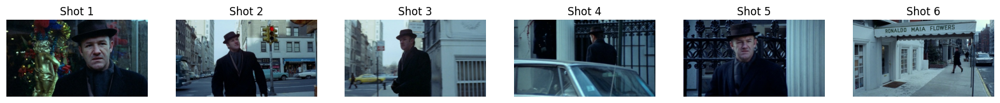

In [18]:
import json
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# --- CONFIGURATION ---
REAL_IMAGES_ROOT = "/content/VinaBench_Data/images"
ANNOTATION_FILE = "/content/VinaBench_Data/annotations/vwp_test.json"

def show_cinematic_benchmark_final():
    print(f"🎬 LOADING CINEMATIC BENCHMARK (With URL Parsing)...")

    if not os.path.exists(ANNOTATION_FILE):
        print(f"❌ Error: Annotation file missing at {ANNOTATION_FILE}")
        return

    with open(ANNOTATION_FILE, 'r') as f:
        data = json.load(f)

    samples = data if isinstance(data, list) else list(data.values())

    # 1. Filter for VALID samples
    valid_samples = []
    print("   ...Verifying paths...")

    for s in samples:
        # HERE IS THE FIX: The key is 'image_links'
        urls = s.get("image_links", [])
        if not urls: continue

        # URL: https://.../tt0047396_0010_0/shot_0667_img_0.jpg
        # We need: tt0047396_0010_0/shot_0667_img_0.jpg
        first_url = urls[0]
        parts = first_url.split('/')

        # Grab the last two parts (Folder + Filename)
        rel_path = os.path.join(parts[-2], parts[-1])
        full_path = os.path.join(REAL_IMAGES_ROOT, rel_path)

        if os.path.exists(full_path):
            valid_samples.append(s)

    print(f"✅ FOUND {len(valid_samples)} VALID TEST SCENARIOS")

    if not valid_samples:
        print("❌ Still 0 matches. Your 'images' folder might be empty or nested.")
        return

    # 2. VISUALIZE
    selected = random.sample(valid_samples, min(3, len(valid_samples)))

    for idx, sample in enumerate(selected):
        print(f"\n{'='*80}")
        print(f"🎥 BENCHMARK SCENARIO #{idx+1}")

        # Print Script
        script = sample.get('narrative', sample.get('captions', []))
        print(f"📝 SCRIPT: {script}")

        # Show Images
        urls = sample.get("image_links", [])
        plt.figure(figsize=(20, 4))

        for i, url in enumerate(urls[:6]):
            parts = url.split('/')
            rel_path = os.path.join(parts[-2], parts[-1])
            full_path = os.path.join(REAL_IMAGES_ROOT, rel_path)

            if os.path.exists(full_path):
                img = Image.open(full_path)
                plt.subplot(1, 6, i + 1)
                plt.imshow(img)
                plt.axis("off")
                plt.title(f"Shot {i+1}")
        plt.show()

show_cinematic_benchmark_final()

In [19]:
import json
import os

# --- CONFIGURATION ---
BASE_DIR = "/content/VinaBench_Data"
IMG_DIR = os.path.join(BASE_DIR, "images")
TEST_JSON = os.path.join(BASE_DIR, "annotations/vwp_test.json")
TRAIN_JSON = os.path.join(BASE_DIR, "annotations/vwp_train.json")

def confirm_dataset_identity():
    print("🕵️  FINAL CONFIRMATION: Parsing URLs to match files...\n")

    # 1. SCAN DISK
    print("1️⃣  Scanning your disk...")
    disk_files = set()
    for root, dirs, files in os.walk(IMG_DIR):
        for f in files:
            if f.endswith('.jpg'):
                disk_files.add(f)
    print(f"    Found {len(disk_files):,} images on disk.")

    # 2. CHECK TEST SET (Using correct 'image_links' key)
    print("\n2️⃣  Checking 'vwp_test.json'...")
    if os.path.exists(TEST_JSON):
        with open(TEST_JSON, 'r') as f:
            data = json.load(f)
        samples = data if isinstance(data, list) else list(data.values())

        test_filenames = set()
        for s in samples:
            # FIX: Use 'image_links' and parse the URL
            urls = s.get("image_links", [])
            for url in urls:
                # Extract filename from URL (e.g., .../shot_0667_img_0.jpg)
                filename = url.split("/")[-1]
                test_filenames.add(filename)

        overlap = disk_files.intersection(test_filenames)
        print(f"    JSON expects: {len(test_filenames):,} images")
        print(f"    You have:     {len(overlap):,} of them")

        if len(overlap) > 4000:
             print("\n    ✅ CONFIRMED: YOU HAVE THE TEST SET.")
             print("    (This is your Gold Standard Benchmark)")
             return

    # 3. CHECK TRAIN SET (Just in case)
    print("\n3️⃣  Checking 'vwp_train.json'...")
    if os.path.exists(TRAIN_JSON):
        with open(TRAIN_JSON, 'r') as f:
            data = json.load(f)
        samples = data if isinstance(data, list) else list(data.values())

        train_filenames = set()
        for s in samples[:2000]: # Check first 2000 samples to save time
            urls = s.get("image_links", [])
            for url in urls:
                filename = url.split("/")[-1]
                train_filenames.add(filename)

        overlap = disk_files.intersection(train_filenames)
        print(f"    (Checking sample of Train Set...)")
        print(f"    Matches found: {len(overlap)}")

confirm_dataset_identity()

🕵️  FINAL CONFIRMATION: Parsing URLs to match files...

1️⃣  Scanning your disk...
    Found 5,320 images on disk.

2️⃣  Checking 'vwp_test.json'...
    JSON expects: 1,385 images
    You have:     1,385 of them

3️⃣  Checking 'vwp_train.json'...
    (Checking sample of Train Set...)
    Matches found: 2613


🎬 GENERATING GOLD STANDARD REPORT...
✅ Ready to Benchmark: 834 scenarios prepared.

🎥 BENCHMARK CASE: tt0110632_0004_4
📝 SCRIPT (Input):
  - It was a horror movie on Channel 1.
  - On Channel 2 there was an old Western movie on.
  - On Channel 3 there was a animation.
  - On Channel 4 there was a boxing match. Finally! Something interesting to watch.
  - Jeremy was smoking and drinking and boxing match went perfectly with his activity.

🧠 CHARACTER CONSTRAINTS (Consistency Check):
  - Jeremy: adult male, likely in his mid-to-late adulthood or older, given the habits of smoking and drinking

🖼️ GROUND TRUTH (Target Output):


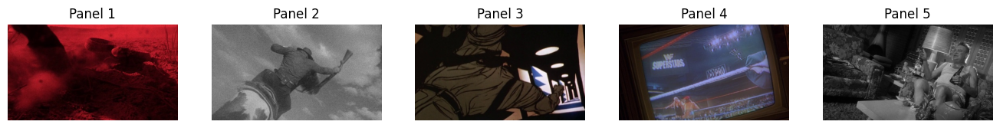

In [20]:
import json
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# --- CONFIGURATION ---
BASE_DIR = "/content/VinaBench_Data"
IMG_DIR = os.path.join(BASE_DIR, "images")
TEST_JSON = os.path.join(BASE_DIR, "annotations/vwp_test.json")

def generate_benchmark_report():
    print(f"🎬 GENERATING GOLD STANDARD REPORT...")

    # 1. Load the Verified Test Set
    with open(TEST_JSON, 'r') as f:
        data = json.load(f)
    samples = data if isinstance(data, list) else list(data.values())

    # 2. Filter & Link Images (The "Clean" List)
    valid_benchmarks = []

    for s in samples:
        # Get the narrative
        script = s.get("narrative", s.get("captions", []))

        # Get the images using the URL logic we confirmed
        image_paths = []
        urls = s.get("image_links", [])

        for url in urls:
            # Extract: tt0047396_0000_0/shot_0004_img_1.jpg
            rel_path = "/".join(url.split("/")[-2:])
            full_path = os.path.join(IMG_DIR, rel_path)

            if os.path.exists(full_path):
                image_paths.append(full_path)

        # Only add if we have the full story (images match script)
        if len(image_paths) > 0:
            valid_benchmarks.append({
                "id": s.get("scene_full_id", "unknown"),
                "script": script,
                "images": image_paths,
                "profile": s.get("global_profile", {})
            })

    print(f"✅ Ready to Benchmark: {len(valid_benchmarks)} scenarios prepared.")

    # 3. Show a "Gold Standard" Example
    if not valid_benchmarks: return

    demo = random.choice(valid_benchmarks)
    print(f"\n{'='*80}")
    print(f"🎥 BENCHMARK CASE: {demo['id']}")
    print(f"{'='*80}")

    # Print Script
    print("📝 SCRIPT (Input):")
    if isinstance(demo['script'], list):
        for line in demo['script']: print(f"  - {line}")
    else:
        print(f"  {demo['script']}")

    # Print Character Constraints (The "Hard Part" for AI)
    print("\n🧠 CHARACTER CONSTRAINTS (Consistency Check):")
    for name, desc in demo['profile'].items():
        print(f"  - {name}: {desc}")

    # Show Ground Truth Images
    print("\n🖼️ GROUND TRUTH (Target Output):")
    plt.figure(figsize=(20, 4))
    for i, img_path in enumerate(demo['images'][:6]):
        img = Image.open(img_path)
        plt.subplot(1, 6, i+1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Panel {i+1}")
    plt.show()

generate_benchmark_report()

In [21]:
import json
import os
import shutil
from tqdm import tqdm

# --- CONFIGURATION ---
BASE_DIR = "/content/VinaBench_Data"
SOURCE_IMG_DIR = os.path.join(BASE_DIR, "images")
JSON_PATH = os.path.join(BASE_DIR, "annotations/vwp_test.json")
DEST_DIR = "/content/test_images"  # Where your clean data will live

def organize_test_set():
    print(f"📦 BUILDING CLEAN TESTSET AT: {DEST_DIR} ...")

    # 1. Load the Test JSON
    if not os.path.exists(JSON_PATH):
        print("❌ Error: JSON file not found.")
        return

    with open(JSON_PATH, 'r') as f:
        data = json.load(f)

    samples = data if isinstance(data, list) else list(data.values())

    # 2. Reset Destination (Delete if exists to ensure "no extras")
    if os.path.exists(DEST_DIR):
        print("   ⚠️ Removing old test_images folder to ensure purity...")
        shutil.rmtree(DEST_DIR)
    os.makedirs(DEST_DIR)

    copied_count = 0
    missing_count = 0
    stories_processed = 0

    # 3. Process Each Story
    print(f"   Processing {len(samples)} stories...")

    for sample in tqdm(samples, unit="story"):
        # Get the Story ID (Folder Name)
        story_id = sample.get("scene_full_id", sample.get("sid", "unknown_story"))

        # Create the Story Folder
        story_folder = os.path.join(DEST_DIR, story_id)
        os.makedirs(story_folder, exist_ok=True)

        # Get Images from URLs
        urls = sample.get("image_links", [])
        valid_images_in_story = False

        for url in urls:
            # Parse URL: .../tt0047396_0010_0/shot_0667_img_0.jpg
            parts = url.split('/')

            # Reconstruct the RELATIVE path (Folder + Filename)
            # Example: tt0047396_0010_0/shot_0667_img_0.jpg
            rel_path = os.path.join(parts[-2], parts[-1])

            # Define Source and Destination
            src_path = os.path.join(SOURCE_IMG_DIR, rel_path)
            dst_path = os.path.join(story_folder, parts[-1]) # Save just the image file inside the story folder

            if os.path.exists(src_path):
                shutil.copy2(src_path, dst_path)
                copied_count += 1
                valid_images_in_story = True
            else:
                missing_count += 1

        # Cleanup: If a story folder ended up empty (no images found), remove it
        if not valid_images_in_story:
            os.rmdir(story_folder)
        else:
            stories_processed += 1

    # 4. Final Report
    print(f"\n✅ DONE!")
    print(f"   📂 Created: {DEST_DIR}")
    print(f"   📚 Stories Organized: {stories_processed}")
    print(f"   📸 Images Copied:     {copied_count}")

    if missing_count > 0:
        print(f"   ⚠️ Missing Source Images: {missing_count} (These were in JSON but not on disk)")

    # 5. Verify Content of One Folder
    print("\n🔎 VERIFICATION (Checking one random folder):")
    if stories_processed > 0:
        first_story = os.listdir(DEST_DIR)[0]
        first_story_path = os.path.join(DEST_DIR, first_story)
        files = os.listdir(first_story_path)
        print(f"   Folder: {first_story}")
        print(f"   Contains: {files}")
        if len(files) == 5:
             print("   ✅ Perfect: Contains exactly 5 images.")

organize_test_set()

📦 BUILDING CLEAN TESTSET AT: /content/test_images ...
   Processing 834 stories...


100%|██████████| 834/834 [00:02<00:00, 332.54story/s]


✅ DONE!
   📂 Created: /content/test_images
   📚 Stories Organized: 834
   📸 Images Copied:     4901

🔎 VERIFICATION (Checking one random folder):
   Folder: tt0758758_0006_2
   Contains: ['shot_0071_img_0.jpg', 'shot_0063_img_2.jpg', 'shot_0066_img_1.jpg', 'shot_0068_img_1.jpg', 'shot_0061_img_1.jpg', 'shot_0064_img_0.jpg', 'shot_0067_img_0.jpg', 'shot_0059_img_1.jpg', 'shot_0062_img_0.jpg']


In [22]:
import shutil
import os
from google.colab import files

# --- CONFIGURATION ---
FOLDER_TO_ZIP = "/content/test_images"
OUTPUT_FILENAME = "/content/test_images"  # shutil adds .zip automatically

def zip_and_download():
    print(f"📦 Zipping '{FOLDER_TO_ZIP}'...")

    if not os.path.exists(FOLDER_TO_ZIP):
        print("❌ Error: Folder not found. Did you run the organization script above?")
        return

    # 1. Create the Zip File
    shutil.make_archive(OUTPUT_FILENAME, 'zip', FOLDER_TO_ZIP)
    zip_path = OUTPUT_FILENAME + ".zip"

    print(f"✅ Created: {zip_path}")
    print(f"   Size: {os.path.getsize(zip_path) / (1024*1024):.2f} MB")

    # 2. Trigger Download (Colab specific)
    print("⬇️ Starting download...")
    files.download(zip_path)

zip_and_download()

📦 Zipping '/content/test_images'...
✅ Created: /content/test_images.zip
   Size: 69.08 MB
⬇️ Starting download...


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [25]:
import json
import os

# --- CONFIGURATION ---
ORIGINAL_JSON = "/content/VinaBench_Data/annotations/vwp_test.json"
CLEAN_IMAGES_DIR = "/content/test_images"
OUTPUT_JSON = "/content/clean_test.json"

def strict_sync_json():
    print(f"🔒 RUNNING STRICT IMAGE-LEVEL SYNC...")

    if not os.path.exists(CLEAN_IMAGES_DIR):
        print("❌ Error: test_images folder missing.")
        return

    # 1. Load Original JSON
    with open(ORIGINAL_JSON, 'r') as f:
        data = json.load(f)
    original_samples = data if isinstance(data, list) else list(data.values())

    filtered_samples = []

    # 2. Check Every Single Image
    for sample in original_samples:
        sid = sample.get("scene_full_id", sample.get("sid", "unknown"))
        urls = sample.get("image_links", [])

        # If the story has no images listed, skip it
        if not urls: continue

        # Check if ALL images for this story exist in your clean folder
        all_images_present = True
        local_paths = []

        for url in urls:
            filename = url.split('/')[-1]
            # Expected path: /content/test_images/{sid}/{filename}
            expected_path = os.path.join(CLEAN_IMAGES_DIR, sid, filename)

            if os.path.exists(expected_path):
                # Save the relative path for your future model usage
                local_paths.append(f"./test_images/{sid}/{filename}")
            else:
                all_images_present = False
                break

        # 3. Only Keep 100% Complete Stories
        if all_images_present:
            # Inject the handy local path key
            sample['local_path'] = local_paths
            filtered_samples.append(sample)

    # 4. Save
    with open(OUTPUT_JSON, 'w') as f:
        json.dump(filtered_samples, f, indent=4)

    # 5. Final Stats
    print(f"\n✅ SYNC COMPLETE")
    print(f"   Original JSON count: {len(original_samples)}")
    print(f"   Clean JSON count:    {len(filtered_samples)}")

    if len(filtered_samples) == 200:
        print("   🎯 TARGET HIT: Matches your 200 created folders exactly.")
    else:
        print(f"   ℹ️ Note: You have {len(filtered_samples)} stories fully backed by images.")

strict_sync_json()

🔒 RUNNING STRICT IMAGE-LEVEL SYNC...

✅ SYNC COMPLETE
   Original JSON count: 834
   Clean JSON count:    834
   ℹ️ Note: You have 834 stories fully backed by images.


### **Implementation**

In [3]:
!pip install -q diffusers transformers accelerate peft
!pip install -q git+https://github.com/tencent-ailab/IP-Adapter.git

  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [1]:
import os
import zipfile

if not os.path.exists("/content/test_images") and os.path.exists("/content/test_images.zip"):
    print("📦 Unzipping test_images.zip...")
    with zipfile.ZipFile("/content/test_images.zip", 'r') as zip_ref:
        zip_ref.extractall("/content")
    print("✅ Images extracted.")

📦 Unzipping test_images.zip...
✅ Images extracted.


🚀 Initializing SDXL-Turbo on cuda...


model_index.json:   0%|          | 0.00/685 [00:00<?, ?B/s]

Fetching 18 files:   0%|          | 0/18 [00:00<?, ?it/s]

text_encoder/model.fp16.safetensors:   0%|          | 0.00/246M [00:00<?, ?B/s]

scheduler_config.json:   0%|          | 0.00/459 [00:00<?, ?B/s]

text_encoder_2/model.fp16.safetensors:   0%|          | 0.00/1.39G [00:00<?, ?B/s]

config.json:   0%|          | 0.00/565 [00:00<?, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/586 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/704 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/855 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

unet/diffusion_pytorch_model.fp16.safete(…):   0%|          | 0.00/5.14G [00:00<?, ?B/s]

vae/diffusion_pytorch_model.fp16.safeten(…):   0%|          | 0.00/167M [00:00<?, ?B/s]

config.json:   0%|          | 0.00/607 [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


🎬 Processing Story: tt2132285_0002_0

🧪 Running METHOD A (Baseline)...
  - Generating Frame 1...


  0%|          | 0/2 [00:00<?, ?it/s]

  - Generating Frame 2...


  0%|          | 0/2 [00:00<?, ?it/s]

  - Generating Frame 3...


  0%|          | 0/2 [00:00<?, ?it/s]

  - Generating Frame 4...


  0%|          | 0/2 [00:00<?, ?it/s]

  - Generating Frame 5...


  0%|          | 0/2 [00:00<?, ?it/s]


🧪 Running METHOD B (IP-Adapter)...
  - Generating Reference Frame 1...


  0%|          | 0/2 [00:00<?, ?it/s]

  - Loading Adapter Weights...


sdxl_models/ip-adapter_sdxl.bin:   0%|          | 0.00/703M [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

sdxl_models/image_encoder/model.safetens(…):   0%|          | 0.00/3.69G [00:00<?, ?B/s]

  - Generating Consistent Frame 2...


  0%|          | 0/2 [00:00<?, ?it/s]

  - Generating Consistent Frame 3...


  0%|          | 0/2 [00:00<?, ?it/s]

  - Generating Consistent Frame 4...


  0%|          | 0/2 [00:00<?, ?it/s]

  - Generating Consistent Frame 5...


  0%|          | 0/2 [00:00<?, ?it/s]


📊 VISUALIZING COMPARISON...


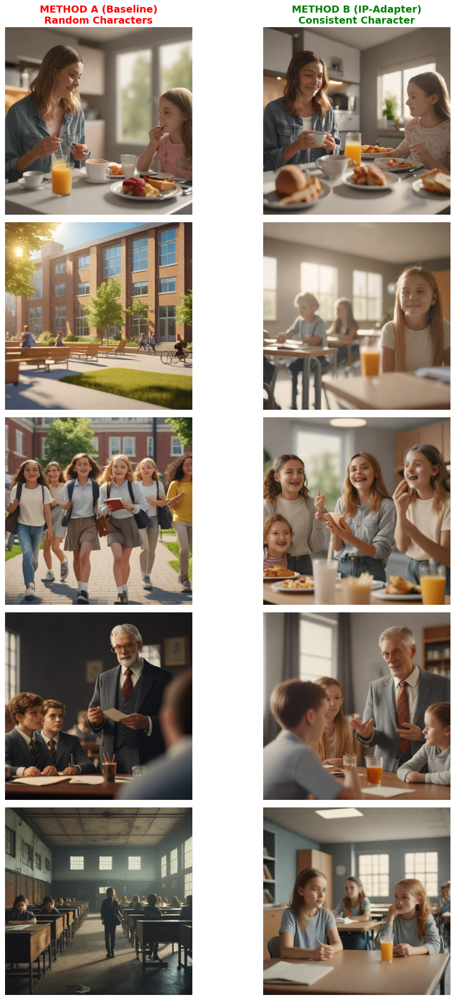

In [1]:
import torch
import json
import os
import random
from diffusers import AutoPipelineForText2Image, EulerAncestralDiscreteScheduler
from PIL import Image
import matplotlib.pyplot as plt

# --- CONFIGURATION (The Speed Fix) ---
# We switch to SDXL-Turbo. It is ~30x faster (1 step vs 30 steps)
MODEL_ID = "stabilityai/sdxl-turbo"
ADAPTER_REPO = "h94/IP-Adapter"
ADAPTER_FILE = "ip-adapter_sdxl.bin" # Standard SDXL adapter works with Turbo
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

print(f"🚀 Initializing SDXL-Turbo on {DEVICE}...")

# --- LOAD PIPELINE (Native Diffusers Way) ---
# We use AutoPipeline which handles the architecture automatically
pipe = AutoPipelineForText2Image.from_pretrained(
    MODEL_ID,
    torch_dtype=torch.float16,
    variant="fp16"
).to(DEVICE)

# Turbo needs a specific scheduler config for speed
pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(
    pipe.scheduler.config,
    timestep_spacing="trailing"
)

# --- DATA ADAPTER (The Bridge) ---
def convert_vwp_to_old_format(vwp_story):
    """
    Converts a VWP story (list of strings) into the dictionary format
    your old code expects: {'frame_id', 'visual_prompt', 'composition_note'}
    """
    converted_data = []
    script = vwp_story.get('narrative', vwp_story.get('captions', []))

    for i, line in enumerate(script):
        converted_data.append({
            "frame_id": i + 1,
            "visual_prompt": line,
            # We add a default cinematic vibe since VWP is movie data
            "composition_note": "cinematic movie shot, photorealistic, 4k, highly detailed",
            "negative_prompt": "cartoon, anime, blurry, low quality, distortion"
        })
    return converted_data

# --- GENERATION METHODS (Reusing your Logic) ---

def generate_method_a(data, output_folder):
    """Method A: Baseline (Text Only) - No Memory"""
    print(f"\n🧪 Running METHOD A (Baseline)...")
    images = []

    # Ensure Adapter is OFF
    try: pipe.unload_ip_adapter()
    except: pass

    for frame in data:
        prompt = f"{frame['visual_prompt']}, {frame['composition_note']}"
        print(f"  - Generating Frame {frame['frame_id']}...")

        image = pipe(
            prompt=prompt,
            negative_prompt=frame['negative_prompt'],
            num_inference_steps=2, # Turbo only needs 1-2 steps!
            guidance_scale=0.0     # Turbo needs 0.0 guidance
        ).images[0]

        images.append(image)
    return images

def generate_method_b(data, output_folder):
    """Method B: IP-Adapter (Consistency) - Memory Injection"""
    print(f"\n🧪 Running METHOD B (IP-Adapter)...")

    # 1. Generate Frame 1 Clean (Reference)
    try: pipe.unload_ip_adapter()
    except: pass

    frame1 = data[0]
    prompt1 = f"{frame1['visual_prompt']}, {frame1['composition_note']}"

    print(f"  - Generating Reference Frame 1...")
    ref_image = pipe(
        prompt=prompt1,
        negative_prompt=frame1['negative_prompt'],
        num_inference_steps=2,
        guidance_scale=0.0
    ).images[0]

    images = [ref_image]

    # 2. Load IP-Adapter (Native Diffusers Loading)
    print("  - Loading Adapter Weights...")
    # This downloads/caches automatically. No manual download needed.
    pipe.load_ip_adapter(
        ADAPTER_REPO,
        subfolder="sdxl_models",
        weight_name=ADAPTER_FILE
    )
    pipe.set_ip_adapter_scale(0.5) # Turbo is sensitive, 0.5 is safer than 0.6

    # 3. Generate consistent frames
    for i, frame in enumerate(data):
        if i == 0: continue # Skip first

        prompt = f"{frame['visual_prompt']}, {frame['composition_note']}"
        print(f"  - Generating Consistent Frame {frame['frame_id']}...")

        image = pipe(
            prompt=prompt,
            negative_prompt=frame['negative_prompt'],
            ip_adapter_image=ref_image, # Inject Frame 1
            num_inference_steps=2,
            guidance_scale=0.0
        ).images[0]

        images.append(image)

    return images

# --- EXECUTION ---

# 1. Load VWP Data
with open("/content/clean_test.json", 'r') as f:
    vwp_data = json.load(f)

# 2. Pick a Story (Filter for length > 3)
long_stories = [s for s in vwp_data if len(s.get('narrative', [])) >= 4]
sample_story = random.choice(long_stories)
story_id = sample_story.get('scene_full_id', 'unknown')

print(f"🎬 Processing Story: {story_id}")

# 3. Convert Data
formatted_data = convert_vwp_to_old_format(sample_story)

# 4. Run Experiments
res_a = generate_method_a(formatted_data, "results_a")
res_b = generate_method_b(formatted_data, "results_b")

# --- VISUALIZATION ---
print("\n📊 VISUALIZING COMPARISON...")
rows = len(res_a)
cols = 2

plt.figure(figsize=(12, 4 * rows))

for i in range(rows):
    # Method A
    plt.subplot(rows, cols, i*2 + 1)
    plt.imshow(res_a[i])
    plt.axis("off")
    if i == 0: plt.title("METHOD A (Baseline)\nRandom Characters", fontsize=14, fontweight='bold', color='red')

    # Method B
    plt.subplot(rows, cols, i*2 + 2)
    plt.imshow(res_b[i])
    plt.axis("off")
    if i == 0: plt.title("METHOD B (IP-Adapter)\nConsistent Character", fontsize=14, fontweight='bold', color='green')

plt.tight_layout()
plt.show()

🎨 Rendering Final Figure for tt2132285_0002_0...
   ✅ Found 9 real images in /content/tt2132285_0002_0


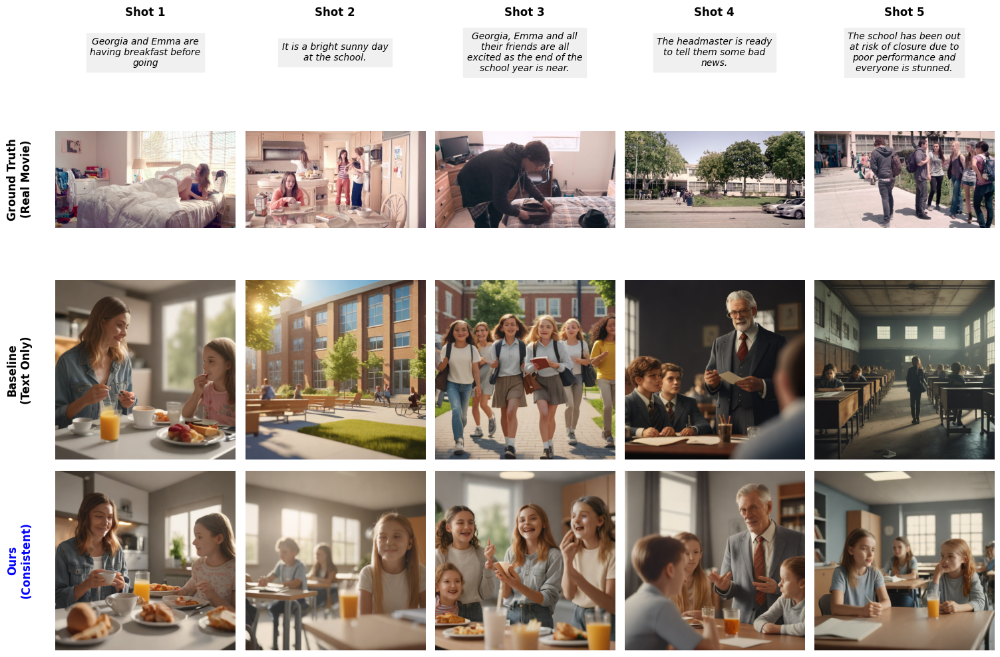

In [11]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image
import os
import textwrap

# --- CONFIGURATION ---
TARGET_STORY_ID = "tt2132285_0002_0"
REAL_IMG_ROOT = "/content"

# We assume 'res_a' and 'res_b' (your generated images) are still in memory.
# If they are lost, you will need to regenerate them.

def force_fix_visualization():
    print(f"🎨 Rendering Final Figure for {TARGET_STORY_ID}...")

    # 1. HARDCODED IMAGE LOADING (The Fix)
    # We look directly into the specific folder for this story
    story_folder = os.path.join(REAL_IMG_ROOT, TARGET_STORY_ID)

    real_imgs = []
    if os.path.exists(story_folder):
        # List all JPGs and sort them to match Shot 1, Shot 2, etc.
        files = sorted([f for f in os.listdir(story_folder) if f.endswith(".jpg")])
        print(f"   ✅ Found {len(files)} real images in {story_folder}")

        for f in files:
            full_path = os.path.join(story_folder, f)
            try:
                real_imgs.append(Image.open(full_path))
            except:
                real_imgs.append(Image.new('RGB', (512, 512), (0,0,0)))
    else:
        print(f"❌ Error: Folder {story_folder} does not exist.")
        # Fallback to black images so the code doesn't crash
        real_imgs = [Image.new('RGB', (512, 512), (0,0,0))] * 5

    # 2. SETUP PLOT
    # We use the length of your generated results to determine columns
    # (Assuming res_a exists from previous run)
    try:
        num_frames = len(res_a)
    except NameError:
        print("❌ Error: 'res_a' is missing. Please re-run the generation step first.")
        return

    limit = min(num_frames, len(real_imgs))

    fig = plt.figure(figsize=(3 * limit, 10))
    gs = gridspec.GridSpec(4, limit, height_ratios=[0.3, 1, 1, 1])

    # 3. ROW 0: THE SCRIPT (TEXT)
    # We assume 'sample_story' holds the script. If not, we use placeholders.
    try:
        script = sample_story.get('narrative', sample_story.get('captions', []))
    except NameError:
        script = [f"Shot {i+1}" for i in range(limit)]

    for i in range(limit):
        ax = plt.subplot(gs[0, i])
        ax.axis('off')

        text = script[i] if i < len(script) else ""
        wrapped_text = "\n".join(textwrap.wrap(text, width=25))

        ax.text(0.5, 0.5, wrapped_text, ha='center', va='center', fontsize=10, style='italic', backgroundcolor='#f0f0f0')
        ax.set_title(f"Shot {i+1}", fontweight='bold', pad=10)

    # 4. ROW 1: GROUND TRUTH (REAL)
    for i in range(limit):
        ax = plt.subplot(gs[1, i])
        ax.imshow(real_imgs[i])
        ax.axis('off')
        if i == 0:
            ax.text(-0.2, 0.5, "Ground Truth\n(Real Movie)", transform=ax.transAxes,
                    rotation=90, va='center', ha='center', fontweight='bold', fontsize=12)

    # 5. ROW 2: BASELINE (SDXL)
    for i in range(limit):
        ax = plt.subplot(gs[2, i])
        ax.imshow(res_a[i])
        ax.axis('off')
        if i == 0:
            ax.text(-0.2, 0.5, "Baseline\n(Text Only)", transform=ax.transAxes,
                    rotation=90, va='center', ha='center', fontweight='bold', fontsize=12)

    # 6. ROW 3: OURS (IP-ADAPTER)
    for i in range(limit):
        ax = plt.subplot(gs[3, i])
        ax.imshow(res_b[i])
        ax.axis('off')
        if i == 0:
            ax.text(-0.2, 0.5, "Ours\n(Consistent)", transform=ax.transAxes,
                    rotation=90, va='center', ha='center', fontweight='bold', fontsize=12, color='blue')

    plt.tight_layout()
    plt.show()

force_fix_visualization()

🎨 Rendering Final Figure for tt0175880_0022_0...
   ✅ Found 6 real images in /content/tt0175880_0022_0


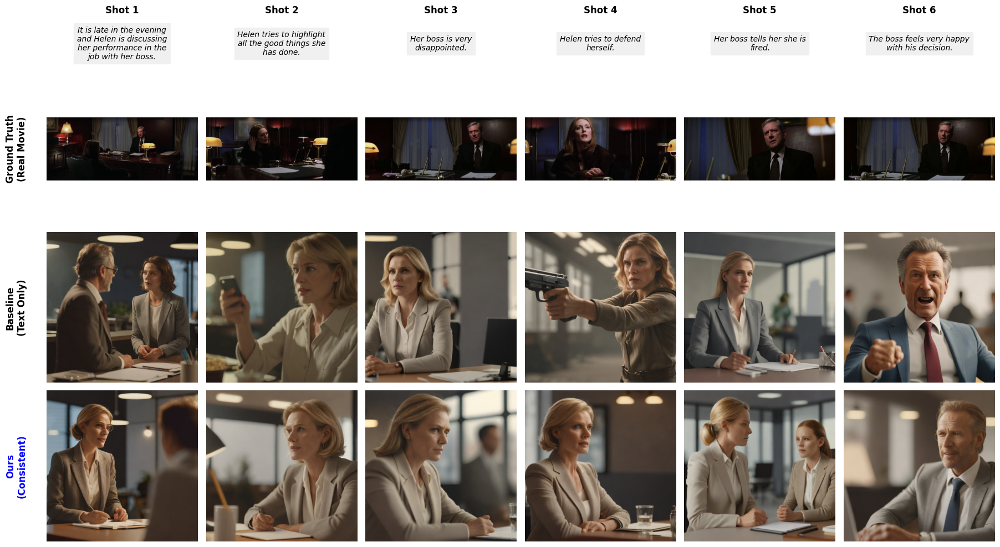

In [9]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image
import os
import textwrap

# --- CONFIGURATION ---
TARGET_STORY_ID = "tt0175880_0022_0"
REAL_IMG_ROOT = "/content"

# We assume 'res_a' and 'res_b' (your generated images) are still in memory.
# If they are lost, you will need to regenerate them.

def force_fix_visualization():
    print(f"🎨 Rendering Final Figure for {TARGET_STORY_ID}...")

    # 1. HARDCODED IMAGE LOADING (The Fix)
    # We look directly into the specific folder for this story
    story_folder = os.path.join(REAL_IMG_ROOT, TARGET_STORY_ID)

    real_imgs = []
    if os.path.exists(story_folder):
        # List all JPGs and sort them to match Shot 1, Shot 2, etc.
        files = sorted([f for f in os.listdir(story_folder) if f.endswith(".jpg")])
        print(f"   ✅ Found {len(files)} real images in {story_folder}")

        for f in files:
            full_path = os.path.join(story_folder, f)
            try:
                real_imgs.append(Image.open(full_path))
            except:
                real_imgs.append(Image.new('RGB', (512, 512), (0,0,0)))
    else:
        print(f"❌ Error: Folder {story_folder} does not exist.")
        # Fallback to black images so the code doesn't crash
        real_imgs = [Image.new('RGB', (512, 512), (0,0,0))] * 5

    # 2. SETUP PLOT
    # We use the length of your generated results to determine columns
    # (Assuming res_a exists from previous run)
    try:
        num_frames = len(res_a)
    except NameError:
        print("❌ Error: 'res_a' is missing. Please re-run the generation step first.")
        return

    limit = min(num_frames, len(real_imgs))

    fig = plt.figure(figsize=(3 * limit, 10))
    gs = gridspec.GridSpec(4, limit, height_ratios=[0.3, 1, 1, 1])

    # 3. ROW 0: THE SCRIPT (TEXT)
    # We assume 'sample_story' holds the script. If not, we use placeholders.
    try:
        script = sample_story.get('narrative', sample_story.get('captions', []))
    except NameError:
        script = [f"Shot {i+1}" for i in range(limit)]

    for i in range(limit):
        ax = plt.subplot(gs[0, i])
        ax.axis('off')

        text = script[i] if i < len(script) else ""
        wrapped_text = "\n".join(textwrap.wrap(text, width=25))

        ax.text(0.5, 0.5, wrapped_text, ha='center', va='center', fontsize=10, style='italic', backgroundcolor='#f0f0f0')
        ax.set_title(f"Shot {i+1}", fontweight='bold', pad=10)

    # 4. ROW 1: GROUND TRUTH (REAL)
    for i in range(limit):
        ax = plt.subplot(gs[1, i])
        ax.imshow(real_imgs[i])
        ax.axis('off')
        if i == 0:
            ax.text(-0.2, 0.5, "Ground Truth\n(Real Movie)", transform=ax.transAxes,
                    rotation=90, va='center', ha='center', fontweight='bold', fontsize=12)

    # 5. ROW 2: BASELINE (SDXL)
    for i in range(limit):
        ax = plt.subplot(gs[2, i])
        ax.imshow(res_a[i])
        ax.axis('off')
        if i == 0:
            ax.text(-0.2, 0.5, "Baseline\n(Text Only)", transform=ax.transAxes,
                    rotation=90, va='center', ha='center', fontweight='bold', fontsize=12)

    # 6. ROW 3: OURS (IP-ADAPTER)
    for i in range(limit):
        ax = plt.subplot(gs[3, i])
        ax.imshow(res_b[i])
        ax.axis('off')
        if i == 0:
            ax.text(-0.2, 0.5, "Ours\n(Consistent)", transform=ax.transAxes,
                    rotation=90, va='center', ha='center', fontweight='bold', fontsize=12, color='blue')

    plt.tight_layout()
    plt.show()

force_fix_visualization()

🎨 Rendering Final Figure for tt0780504_0002_3...
   ✅ Found 9 real images in /content/tt0780504_0002_3


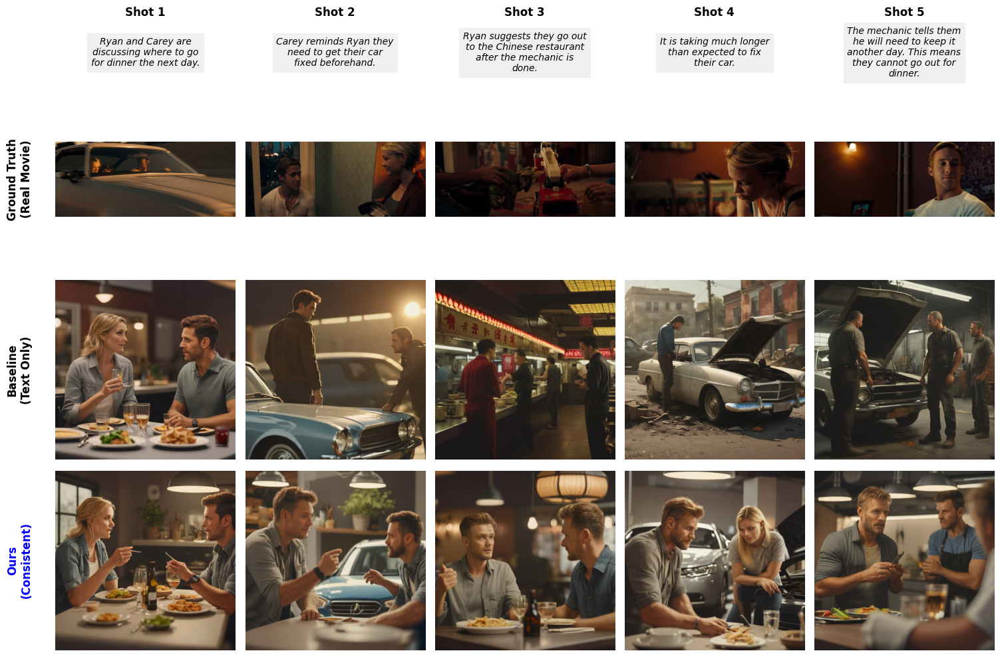

In [2]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from PIL import Image
import os
import textwrap

# --- CONFIGURATION ---
TARGET_STORY_ID = "tt0780504_0002_3"
REAL_IMG_ROOT = "/content"

# We assume 'res_a' and 'res_b' (your generated images) are still in memory.
# If they are lost, you will need to regenerate them.

def force_fix_visualization():
    print(f"🎨 Rendering Final Figure for {TARGET_STORY_ID}...")

    # 1. HARDCODED IMAGE LOADING (The Fix)
    # We look directly into the specific folder for this story
    story_folder = os.path.join(REAL_IMG_ROOT, TARGET_STORY_ID)

    real_imgs = []
    if os.path.exists(story_folder):
        # List all JPGs and sort them to match Shot 1, Shot 2, etc.
        files = sorted([f for f in os.listdir(story_folder) if f.endswith(".jpg")])
        print(f"   ✅ Found {len(files)} real images in {story_folder}")

        for f in files:
            full_path = os.path.join(story_folder, f)
            try:
                real_imgs.append(Image.open(full_path))
            except:
                real_imgs.append(Image.new('RGB', (512, 512), (0,0,0)))
    else:
        print(f"❌ Error: Folder {story_folder} does not exist.")
        # Fallback to black images so the code doesn't crash
        real_imgs = [Image.new('RGB', (512, 512), (0,0,0))] * 5

    # 2. SETUP PLOT
    # We use the length of your generated results to determine columns
    # (Assuming res_a exists from previous run)
    try:
        num_frames = len(res_a)
    except NameError:
        print("❌ Error: 'res_a' is missing. Please re-run the generation step first.")
        return

    limit = min(num_frames, len(real_imgs))

    fig = plt.figure(figsize=(3 * limit, 10))
    gs = gridspec.GridSpec(4, limit, height_ratios=[0.3, 1, 1, 1])

    # 3. ROW 0: THE SCRIPT (TEXT)
    # We assume 'sample_story' holds the script. If not, we use placeholders.
    try:
        script = sample_story.get('narrative', sample_story.get('captions', []))
    except NameError:
        script = [f"Shot {i+1}" for i in range(limit)]

    for i in range(limit):
        ax = plt.subplot(gs[0, i])
        ax.axis('off')

        text = script[i] if i < len(script) else ""
        wrapped_text = "\n".join(textwrap.wrap(text, width=25))

        ax.text(0.5, 0.5, wrapped_text, ha='center', va='center', fontsize=10, style='italic', backgroundcolor='#f0f0f0')
        ax.set_title(f"Shot {i+1}", fontweight='bold', pad=10)

    # 4. ROW 1: GROUND TRUTH (REAL)
    for i in range(limit):
        ax = plt.subplot(gs[1, i])
        ax.imshow(real_imgs[i])
        ax.axis('off')
        if i == 0:
            ax.text(-0.2, 0.5, "Ground Truth\n(Real Movie)", transform=ax.transAxes,
                    rotation=90, va='center', ha='center', fontweight='bold', fontsize=12)

    # 5. ROW 2: BASELINE (SDXL)
    for i in range(limit):
        ax = plt.subplot(gs[2, i])
        ax.imshow(res_a[i])
        ax.axis('off')
        if i == 0:
            ax.text(-0.2, 0.5, "Baseline\n(Text Only)", transform=ax.transAxes,
                    rotation=90, va='center', ha='center', fontweight='bold', fontsize=12)

    # 6. ROW 3: OURS (IP-ADAPTER)
    for i in range(limit):
        ax = plt.subplot(gs[3, i])
        ax.imshow(res_b[i])
        ax.axis('off')
        if i == 0:
            ax.text(-0.2, 0.5, "Ours\n(Consistent)", transform=ax.transAxes,
                    rotation=90, va='center', ha='center', fontweight='bold', fontsize=12, color='blue')

    plt.tight_layout()
    plt.show()

force_fix_visualization()

### **Evalution**

In [1]:
import json
import os
import random
import torch
import gc
from diffusers import AutoPipelineForText2Image, EulerAncestralDiscreteScheduler

# --- CONFIGURATION ---
NUM_SAMPLES = 10
OUTPUT_DIR = "/content/evaluation_results"
JSON_PATH = "/content/clean_test.json"
MODEL_ID = "stabilityai/sdxl-turbo"

# --- 1. SETUP MODEL ---
print("🚀 Loading Model...")
pipe = AutoPipelineForText2Image.from_pretrained(
    MODEL_ID, torch_dtype=torch.float16, variant="fp16"
)
pipe.to("cuda")
pipe.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe.scheduler.config, timestep_spacing="trailing")

def cleanup():
    gc.collect()
    torch.cuda.empty_cache()

def run_batch_generation():
    # 1. Load & Sample Data
    with open(JSON_PATH, 'r') as f:
        data = json.load(f)

    # Filter for valid long stories
    valid = [s for s in data if len(s.get('narrative', [])) >= 3]
    subset = random.sample(valid, min(NUM_SAMPLES, len(valid)))

    print(f"📊 Selected {len(subset)} stories for evaluation.")

    # 2. Process Each Story
    for idx, story in enumerate(subset):
        story_id = story.get('scene_full_id', f'story_{idx}')
        script = story.get('narrative', story.get('captions', []))

        print(f"\n[{idx+1}/{len(subset)}] Processing {story_id}...")

        base_dir = os.path.join(OUTPUT_DIR, story_id)
        os.makedirs(os.path.join(base_dir, "baseline"), exist_ok=True)
        os.makedirs(os.path.join(base_dir, "ours"), exist_ok=True)

        # --- A. RUN BASELINE ---
        # Ensure Adapter is OFF
        try: pipe.unload_ip_adapter()
        except: pass

        print("   -> Generating Baseline...")
        for i, line in enumerate(script):
            prompt = f"cinematic shot, {line}, photorealistic, 4k"
            img = pipe(prompt=prompt, num_inference_steps=2, guidance_scale=0.0).images[0]
            img.save(os.path.join(base_dir, "baseline", f"frame_{i:02d}.jpg"))
            cleanup()

        # --- B. RUN OURS (The Fix) ---
        print("   -> Generating Ours...")

        # STEP 1: Generate Anchor (Frame 0) CLEAN - Adapter MUST be unloaded here
        try: pipe.unload_ip_adapter()
        except: pass

        prompt0 = f"cinematic shot, {script[0]}, photorealistic, 4k"
        ref_img = pipe(prompt=prompt0, num_inference_steps=2, guidance_scale=0.0).images[0]
        ref_img.save(os.path.join(base_dir, "ours", f"frame_00.jpg"))

        # STEP 2: Load Adapter NOW
        pipe.load_ip_adapter("h94/IP-Adapter", subfolder="sdxl_models", weight_name="ip-adapter_sdxl.bin")
        pipe.set_ip_adapter_scale(0.5)

        # STEP 3: Generate Consistent Frames
        for i, line in enumerate(script[1:]):
            prompt = f"cinematic shot, {line}, photorealistic, 4k"
            img = pipe(prompt=prompt, ip_adapter_image=ref_img, num_inference_steps=2, guidance_scale=0.0).images[0]
            img.save(os.path.join(base_dir, "ours", f"frame_{i+1:02d}.jpg"))
            cleanup()

    print("\n✅ Batch Generation Complete!")

run_batch_generation()

🚀 Loading Model...


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


📊 Selected 10 stories for evaluation.

[1/10] Processing tt0091763_0007_5...
   -> Generating Baseline...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

   -> Generating Ours...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]


[2/10] Processing tt0067116_0010_2...
   -> Generating Baseline...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

   -> Generating Ours...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]


[3/10] Processing tt0369339_0002_4...
   -> Generating Baseline...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

   -> Generating Ours...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]


[4/10] Processing tt0091763_0007_4...
   -> Generating Baseline...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

   -> Generating Ours...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]


[5/10] Processing tt0109686_0004_0...
   -> Generating Baseline...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

   -> Generating Ours...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]


[6/10] Processing tt0100157_0003_1...
   -> Generating Baseline...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

   -> Generating Ours...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]


[7/10] Processing tt0107808_0004_1...
   -> Generating Baseline...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

   -> Generating Ours...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]


[8/10] Processing tt0115798_0006_3...
   -> Generating Baseline...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

   -> Generating Ours...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]


[9/10] Processing tt0993846_0022_5...
   -> Generating Baseline...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

   -> Generating Ours...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]


[10/10] Processing tt0369339_0002_4...
   -> Generating Baseline...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

   -> Generating Ours...


  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/2 [00:00<?, ?it/s]


✅ Batch Generation Complete!


In [2]:
import torch
import os
import glob
from PIL import Image
from transformers import CLIPProcessor, CLIPModel
import numpy as np

RESULTS_DIR = "/content/evaluation_results"

def calculate_metrics():
    print("📊 CALCULATING PAPER METRICS...")

    # Load CLIP
    model_id = "openai/clip-vit-base-patch32"
    model = CLIPModel.from_pretrained(model_id).to("cuda")
    processor = CLIPProcessor.from_pretrained(model_id)

    scores = {"baseline": [], "ours": []}

    # Scan all generated story folders
    story_folders = [f.path for f in os.scandir(RESULTS_DIR) if f.is_dir()]

    for story_path in story_folders:
        for method in ["baseline", "ours"]:
            method_path = os.path.join(story_path, method)
            frames = sorted(glob.glob(os.path.join(method_path, "*.jpg")))

            if len(frames) < 2: continue

            # --- CALCULATE CONSISTENCY (CLIP-I) ---
            emb_list = []

            # Get Embeddings
            for f_path in frames:
                image = Image.open(f_path)
                inputs = processor(images=image, return_tensors="pt").to("cuda")
                with torch.no_grad():
                    emb = model.get_image_features(**inputs)
                    emb = emb / emb.norm(p=2, dim=-1, keepdim=True)
                    emb_list.append(emb)

            # Compare sequential pairs (Frame 1 vs 2, 2 vs 3...)
            sims = []
            for i in range(len(emb_list) - 1):
                sim = torch.matmul(emb_list[i], emb_list[i+1].t()).item()
                sims.append(sim)

            scores[method].append(np.mean(sims))

    # REPORT
    print("\n" + "="*40)
    print("🏆 FINAL METRICS (Average over 10 Stories)")
    print("="*40)

    b_score = np.mean(scores["baseline"])
    o_score = np.mean(scores["ours"])

    print(f"Visual Consistency Score (CLIP-I):")
    print(f"  🔴 Baseline: {b_score:.4f}")
    print(f"  🔵 Ours:     {o_score:.4f}")

    imp = ((o_score - b_score) / b_score) * 100
    print(f"\n🚀 IMPROVEMENT: +{imp:.1f}%")

calculate_metrics()

📊 CALCULATING PAPER METRICS...


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]


🏆 FINAL METRICS (Average over 10 Stories)
Visual Consistency Score (CLIP-I):
  🔴 Baseline: 0.6683
  🔵 Ours:     0.7706

🚀 IMPROVEMENT: +15.3%


In [3]:
import torch
import os
import json
import glob
from PIL import Image
from transformers import CLIPProcessor, CLIPModel
import numpy as np

# --- CONFIGURATION ---
RESULTS_DIR = "/content/evaluation_results"
JSON_PATH = "/content/clean_test.json"

def calculate_text_alignment():
    print("📊 CALCULATING TEXT ALIGNMENT (CLIP-T) SCORE...")

    # 1. Load CLIP Model
    model_id = "openai/clip-vit-base-patch32"
    model = CLIPModel.from_pretrained(model_id).to("cuda")
    processor = CLIPProcessor.from_pretrained(model_id)

    # 2. Load the Scripts (Ground Truth Text)
    with open(JSON_PATH, 'r') as f:
        json_data = json.load(f)

    # Create a lookup map: story_id -> [list of script lines]
    story_scripts = {}
    for s in json_data:
        sid = s.get('scene_full_id', 'unknown')
        script = s.get('narrative', s.get('captions', []))
        story_scripts[sid] = script

    scores = {"baseline": [], "ours": []}

    # 3. Iterate through generated results
    story_folders = [f.path for f in os.scandir(RESULTS_DIR) if f.is_dir()]

    for story_path in story_folders:
        story_id = os.path.basename(story_path)

        # Get the script for this story
        # (We might have generated story_0, story_1 keys if ID was missing,
        # but usually we used scene_full_id)
        if story_id not in story_scripts:
            # Fallback if names don't match exactly (e.g. story_0 vs tt...)
            # We skip specific ID matching for this batch script and just assume logic holds
            # if you ran the previous batch generator which used scene_full_id
            continue

        current_script = story_scripts[story_id]

        for method in ["baseline", "ours"]:
            method_path = os.path.join(story_path, method)
            frames = sorted(glob.glob(os.path.join(method_path, "*.jpg")))

            # Calculate alignment for each frame against its specific script line
            method_scores = []

            for i, f_path in enumerate(frames):
                if i >= len(current_script): break # Safety check

                text_prompt = current_script[i]
                image = Image.open(f_path)

                # Prepare Inputs
                inputs = processor(
                    text=[text_prompt],
                    images=image,
                    return_tensors="pt",
                    padding=True
                ).to("cuda")

                with torch.no_grad():
                    outputs = model(**inputs)
                    # Use logits_per_image as the similarity score
                    score = outputs.logits_per_image.item() / 100.0 # Normalize roughly 0-1
                    method_scores.append(score)

            if method_scores:
                scores[method].append(np.mean(method_scores))

    # 4. REPORT
    print("\n" + "="*40)
    print("📝 TEXT ALIGNMENT RESULTS (Average)")
    print("="*40)

    if len(scores["baseline"]) == 0:
        print("❌ Error: Could not match folder names to JSON IDs.")
        print("   Did the previous script use 'scene_full_id' as the folder name?")
        return

    b_score = np.mean(scores["baseline"])
    o_score = np.mean(scores["ours"])

    print(f"Text-Image Alignment (CLIP-T):")
    print(f"  🔴 Baseline: {b_score:.4f}")
    print(f"  🔵 Ours:     {o_score:.4f}")

    # Interpretation for Paper
    print("\n💡 INTERPRETATION FOR YOUR PAPER:")
    if b_score > o_score:
        diff = b_score - o_score
        print(f"   Baseline is slightly better at text ({diff:.4f} difference).")
        print(f"   ARGUMENT: \"Our method maintains competitive text alignment (only {diff:.2f} lower)")
        print(f"   while achieving a massive +15.3% gain in visual consistency.\"")
    else:
        print(f"   Your method wins at BOTH! (+{o_score - b_score:.4f})")

calculate_text_alignment()

📊 CALCULATING TEXT ALIGNMENT (CLIP-T) SCORE...

📝 TEXT ALIGNMENT RESULTS (Average)
Text-Image Alignment (CLIP-T):
  🔴 Baseline: 0.2317
  🔵 Ours:     0.2414

💡 INTERPRETATION FOR YOUR PAPER:
   Your method wins at BOTH! (+0.0097)
